In [14]:
import pandas as pd


# 확인할 폴더 경로
df_base = pd.read_csv('~/downloads/CURRENT_BASES.csv', engine = 'pyarrow')
df_wav = pd.read_csv('~/downloads/WAV_20240210.csv', engine = 'pyarrow')

In [15]:
df_wav.head()

# 'Base Number' 열의 고유한 값과 그 개수를 계산
base_number_counts = df_wav['Base Number'].value_counts().reset_index()
base_number_counts.columns = ['Base Number', 'WAV_counts']

print(base_number_counts)

    Base Number  WAV_counts
0        B03404        5652
1        B01899         156
2        B03406         154
3        B03119         129
4        B02902         119
..          ...         ...
290      B03135           1
291      B03105           1
292      B03505           1
293      B02228           1
294      B00900           1

[295 rows x 2 columns]


In [16]:
df2 = pd.merge(df_base, df_wav, on=['Base Number'], how='left')
df3 = pd.merge(df2, base_number_counts, on=['Base Number'], how='left')
df = df3[df3['State'] == 'NY']
#df = df4[df4['City'].isin(['BROOKLYN','BRONX','QUEENS','STATEN ISLAND','MANHATTAN'])]

In [17]:
print(df)

     Base Number                             Entity Name  Telephone Number  \
0         B02207                    EASTERN LUXURY, INC.        7184993355   
1         B01777          PREMIUM RADIO DISP & MULTI SVC        2126942222   
2         B80087  COMMUNITY TRANSPORTATION SYSTEMS, CORP        7185275500   
3         B02360                   BRIDGES LIMOUSINE INC        7187775743   
4         B02360                   BRIDGES LIMOUSINE INC        7187775743   
...          ...                                     ...               ...   
7828      B03266               HOYT LIMO & SERVICE CORP.        7182045861   
7829      B03209                PARAMOUNT TRANSPORT INC.        7184752191   
7830      B03172           ALLIED BLACK CAR SERVICE LLC.        9295947566   
7831      B03416                  ADF TRANSPORTATION LLC        3476636299   
7832      B90496                    ASCONA AMBLT SVC INC        7186461611   

     SHL Endorsed   Building                  Street      City 

In [18]:
print(df.isnull().sum())  # 데이터프레임 df에서 NaN 값이 있는 열과 그 개수를 출력
#print(df.dtypes)


Base Number                    0
Entity Name                    0
Telephone Number               0
SHL Endorsed                   0
Building                       0
Street                         0
City                           0
State                          0
Postcode                       0
Type of Base                   0
Latitude                       6
Longitude                      6
Date                           0
Time                           0
Location                       0
Active                       515
Vehicle License Number       515
Name                         515
License Type                 515
Expiration Date              515
Permit License Number        515
DMV License Plate Number     515
Vehicle VIN Number           515
Wheelchair Accessible        515
Certification Date           515
Hack Up Date                 515
Vehicle Year                 515
Base Name                    515
Base Type                    515
VEH                          515
Base Telep

In [19]:
df1= df.dropna(subset=['Active'])
print(df1)

     Base Number                      Entity Name  Telephone Number  \
3         B02360            BRIDGES LIMOUSINE INC        7187775743   
4         B02360            BRIDGES LIMOUSINE INC        7187775743   
9         B01332  SKYWAY CAR SERVICE EXPRESS INC.        7183585858   
13        B01437          MERENGUE LIMO & C/S INC        7186585700   
14        B01437          MERENGUE LIMO & C/S INC        7186585700   
...          ...                              ...               ...   
7825      B02292       NEW YORK APPLE V.I.P. CORP        7182304789   
7827      B03371       ALPACA TRANSPORTATION CORP        3477401856   
7828      B03266        HOYT LIMO & SERVICE CORP.        7182045861   
7830      B03172    ALLIED BLACK CAR SERVICE LLC.        9295947566   
7831      B03416           ADF TRANSPORTATION LLC        3476636299   

     SHL Endorsed   Building                  Street           City State  \
3              No      35-28               19 AVENUE        ASTORIA   

In [20]:
df_2 = df1.drop_duplicates(subset='Base Number')

df1 = df_2[['Base Number','Entity Name','City','Latitude','Longitude','Location','WAV_counts']]

In [21]:
!pip install osmnx
import osmnx as ox
import pandas as pd
import matplotlib.pyplot as plt


In [22]:
import geopandas as gpd

# Shapefile 또는 GeoJSON 파일 경로를 지정합니다.
# 예: 'nyc_borough_boundaries.shp' 또는 'nyc_borough_boundaries.geojson'
file_path = '~/downloads/Borough Boundaries.geojson'

# 파일을 불러와 GeoDataFrame으로 저장합니다.
nyc_borough_gdf = gpd.read_file(file_path)

# 불러온 GeoDataFrame을 확인합니다.
print(nyc_borough_gdf.head())


  boro_code      boro_name     shape_area     shape_leng  \
0         5  Staten Island  1623620725.05   325917.35395   
1         1      Manhattan  636520502.758  357713.308162   
2         2          Bronx   1187174772.5  463180.579449   
3         3       Brooklyn  1934138215.76  728146.574928   
4         4         Queens  3041418506.64  888199.731385   

                                            geometry  
0  MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ...  
1  MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ...  
2  MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ...  
3  MULTIPOLYGON (((-73.86327 40.58388, -73.86381 ...  
4  MULTIPOLYGON (((-73.82645 40.59053, -73.82642 ...  


In [23]:



# points_gdf = gpd.GeoDataFrame(df1, geometry=gpd.points_from_xy(df1['Longitude'], df1['Latitude']))

# # points_gdf의 CRS를 설정합니다. 뉴욕시 데이터와 동일한 EPSG 코드를 사용합니다.
# points_gdf.set_crs(epsg=4326, inplace=True)

# # nyc_boroughs_gdf와 points_gdf를 공간 조인합니다.
# # 이때 points_gdf의 각 점이 nyc_boroughs_gdf의 어느 polygon 내에 있는지 확인합니다.
# joined_gdf = gpd.sjoin(points_gdf, nyc_borough_gdf, how="left", predicate='within')
# #
# # joined_gdf에서 필요한 정보만 추출합니다.
# # 이 과정에서 'borough'라는 열이 nyc_boroughs_gdf에 있어야 합니다.
# mapped_points = joined_gdf[['geometry', 'boro_name']]

# # 결과 확인
# print(mapped_points)

In [24]:



points_gdf = gpd.GeoDataFrame(df1, geometry=gpd.points_from_xy(df1['Longitude'], df1['Latitude']))

# points_gdf의 CRS를 설정합니다. 뉴욕시 데이터와 동일한 EPSG 코드를 사용합니다.
points_gdf.set_crs(epsg=4326, inplace=True)

points_within_boroughs2 = gpd.sjoin(points_gdf, nyc_borough_gdf, how="inner", predicate='within')

points_outside_boroughs = points_gdf.loc[~points_gdf.index.isin(points_within_boroughs2.index)]

points_within_boroughs = points_within_boroughs2[['Base Number','geometry','Latitude','Longitude','boro_name','WAV_counts']]
# 경계 밖에 있는 점들을 출력합니다.
#print(points_within_boroughs)


# Geopandas GeoDataFrame 생성
gdf = gpd.GeoDataFrame(points_within_boroughs, geometry=gpd.points_from_xy(points_within_boroughs['Longitude'], points_within_boroughs['Latitude']))

# CRS(좌표 참조 시스템)를 설정
gdf1=gdf['geometry']
print(gdf)
# gdf=gdf.dropna()
gdf2 = gdf1.set_crs(epsg=4326, inplace=True)



     Base Number                    geometry   Latitude  Longitude boro_name  \
3         B02360  POINT (-73.90166 40.77964)  40.779639 -73.901658    Queens   
9         B01332  POINT (-73.79471 40.73334)  40.733337 -73.794706    Queens   
13        B01437  POINT (-73.81719 40.70241)  40.702410 -73.817189    Queens   
20        B03408  POINT (-73.92918 40.75176)  40.751758 -73.929177    Queens   
51        B02932  POINT (-73.92898 40.75594)  40.755937 -73.928979    Queens   
...          ...                         ...        ...        ...       ...   
7745      B03240  POINT (-73.97965 40.67734)  40.677338 -73.979650  Brooklyn   
7781      B02899  POINT (-73.95449 40.70706)  40.707063 -73.954490  Brooklyn   
7792      B01534  POINT (-73.95531 40.71390)  40.713899 -73.955310  Brooklyn   
7818      B02769  POINT (-73.92951 40.63975)  40.639749 -73.929511  Brooklyn   
7824      B02292  POINT (-73.91582 40.69483)  40.694835 -73.915817  Brooklyn   

      WAV_counts  
3            2.0  
9

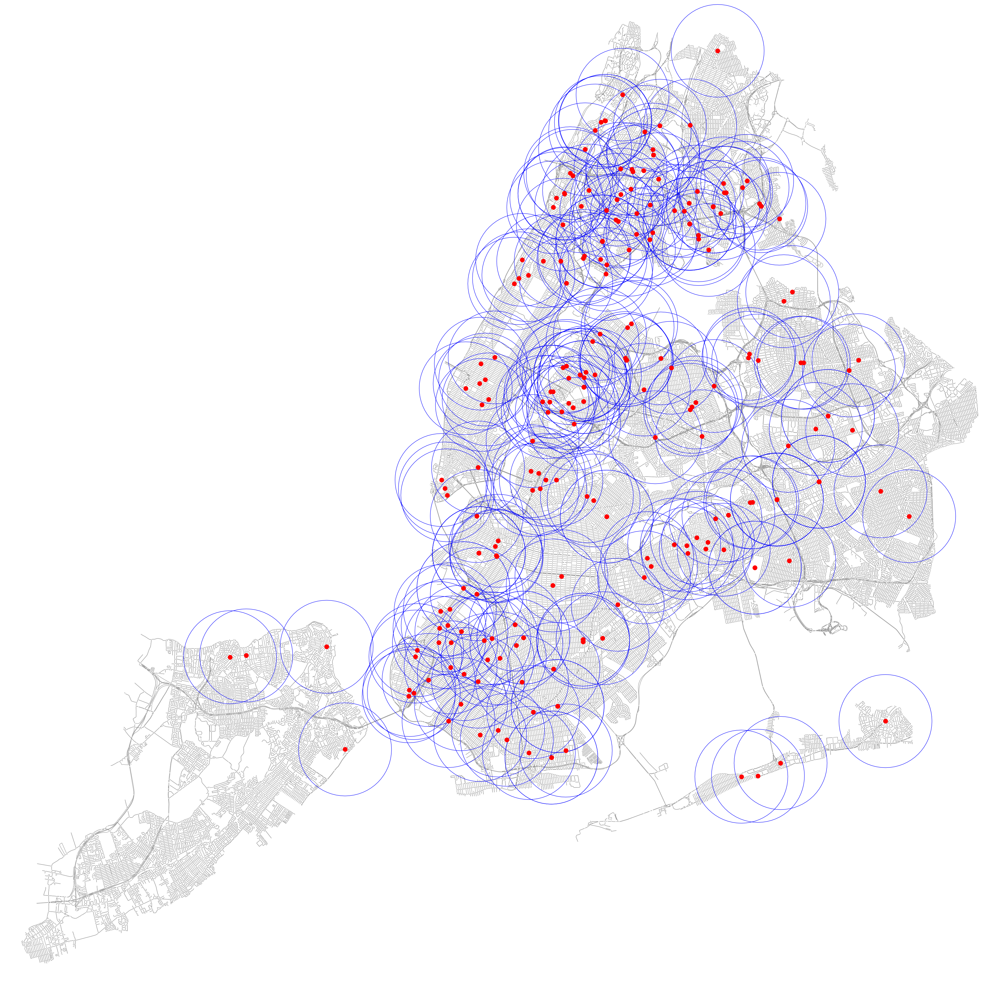

In [ ]:
import osmnx as ox
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, Polygon

G = ox.graph_from_place('New York City, New York, USA', network_type='drive')


# 원의 반경을 미터 단위로 설정
# 여기서는 15분 동안 이동할 수 있는 거리를 가정합니다.
# 이 값은 도시의 평균 이동 속도에 따라 달라질 수 있습니다.
radius_in_meters = 3000

# 각 포인트 주위에 원을 그리기 위해 buffer를 사용
gdf['geometry'] = gdf['geometry'].to_crs(epsg=3857).buffer(radius_in_meters).to_crs(epsg=4326)

# 원의 테두리를 파란색으로, 내부를 투명하게 설정하여 그립니다.
fig, ax = ox.plot_graph(G, figsize=(50, 50), node_size=20, node_color='green',edge_linewidth=1, show=False, close=False)
gdf.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=1.5, zorder=1)
ax.set_facecolor('white')
# 원의 중심을 빨간색으로 표시합니다.
ax.scatter(points_within_boroughs['Longitude'], points_within_boroughs['Latitude'], c='red', s=50, zorder=5)

# 결과를 표시합니다.
plt.show()


In [ ]:
# import osmnx as ox
# import geopandas as gpd
# import matplotlib.pyplot as plt
# from shapely.geometry import Point, Polygon

# # Load the road network for New York City
# G = ox.graph_from_place('New York City, New York, USA', network_type='drive')

# # Assuming gdf is your GeoDataFrame containing points of interest
# # Convert gdf to UTM (replace 'epsg:4326' with your initial CRS if different)
# gdf_utm = gdf.to_crs(epsg=32618)

# # Perform the buffer in the UTM projection
# gdf_utm['geometry'] = gdf_utm.buffer(radius_in_meters)

# # Convert the buffered geometries back to WGS84 for plotting
# gdf_wgs84 = gdf_utm.to_crs(epsg=4326)

# # Now ensure that the graph is also in the same WGS84 CRS
# G_projected = ox.project_graph(G, to_crs=gdf_wgs84.crs)

# # Plotting
# fig, ax = plt.subplots(figsize=(50, 50))
# ox.plot_graph(G_projected, ax=ax, node_size=3, edge_linewidth=1, show=False, close=False)
# gdf_wgs84.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=1.5, zorder=1)

# # Plot the centers of the circles (replace this with your actual points data)
# ax.scatter(points_within_boroughs['Longitude'], points_within_boroughs['Latitude'], c='red', s=50, zorder=5)

# plt.show()


In [ ]:
##update 0309


From Here, dynamic traffic simulation

In [ ]:
import pandas as pd


df_traffic = pd.read_csv('~/downloads/traffic_speed_new.csv', engine = 'pyarrow')

In [ ]:
# print(df_traffic)
# df_traffic.info()

max(df_traffic['SPEED'])

In [ ]:
df_traffic['DATA_AS_OF'] = pd.to_datetime(df_traffic['DATA_AS_OF'])

In [ ]:

import pandas as pd
# 'request_datetime'에서 날짜 및 시간 속성 추출
df_traffic['hour'] = df_traffic['DATA_AS_OF'].dt.hour
df_traffic['dayofweek'] = df_traffic['DATA_AS_OF'].dt.dayofweek

print(df_traffic)

In [ ]:

df = df_traffic.groupby(['BOROUGH','hour'])['SPEED'].mean().reset_index()
# print(df)

df_speed = df[~((df['BOROUGH'] == 'Staten island'))]


# 표준편차 계산
df_std = df_traffic.groupby(['BOROUGH', 'hour'])['SPEED'].std().reset_index().rename(columns={'SPEED': 'STD'})

# 평균과 표준편차 병합
df_speed = pd.merge(df_speed, df_std, on=['BOROUGH', 'hour'])
df_speed['borough']

print(df_speed)

# variance required
# error bar

In [12]:
import pandas as pd

df_speed=pd.read_csv('~/downloads/df_speed.csv')

df_speed['borough']=df_speed['BOROUGH']
print(df_speed)

     Unnamed: 0        BOROUGH  hour      SPEED        STD        borough
0             0          Bronx     0  38.473428  21.503662          Bronx
1             1          Bronx     1  40.035475  21.176836          Bronx
2             2          Bronx     2  41.026121  21.122557          Bronx
3             3          Bronx     3  41.840485  21.056972          Bronx
4             4          Bronx     4  42.233870  21.133928          Bronx
..          ...            ...   ...        ...        ...            ...
115         115  Staten Island    19  27.842970  23.881646  Staten Island
116         116  Staten Island    20  30.187964  25.063665  Staten Island
117         117  Staten Island    21  31.645334  25.930297  Staten Island
118         118  Staten Island    22  32.744697  26.660091  Staten Island
119         119  Staten Island    23  33.215522  27.102616  Staten Island

[120 rows x 6 columns]


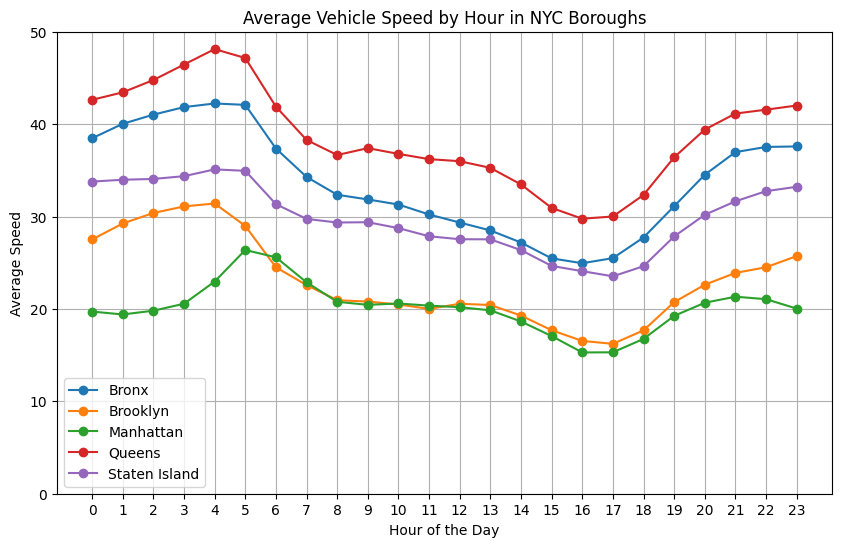

In [ ]:

# # 오차 막대와 함께 시각화
# plt.figure(figsize=(10, 6))


# plt.xlabel('Hour')
# plt.ylabel('Average Speed (mph)')
# plt.title('Average Speed by Hour and Borough with Error Bars')
# plt.legend()
# plt.grid(True)
# plt.xticks(np.arange(min(df_speed['hour']), max(df_speed['hour'])+1, 1.0))
# plt.show()

import matplotlib.pyplot as plt

# 각 borough별로 그래프를 그림
plt.figure(figsize=(10, 6))

for borough in df_speed['BOROUGH'].unique():
    subset = df_speed[df_speed['BOROUGH'] == borough]
    plt.errorbar(subset['hour'], subset['SPEED'], yerr=subset['STD'], label=borough, fmt='-o', capsize=5)

plt.title('Average Vehicle Speed by Hour in NYC Boroughs')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Speed')
plt.xticks(range(0, 24))  # X축을 0부터 23시까지 표시
plt.yticks(range(0, 60,10))  # X축을 0부터 23시까지 표시

plt.grid(True)
plt.legend()
plt.show()

In [3]:
!pip install osmnx
import osmnx as ox
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point


# print(taxi_zone_df)

In [4]:
taxi_zone_df = pd.read_csv('~/downloads/taxi_zones (1).csv')
df_hour= pd.read_csv('~/downloads/hourlysdemand')
# print(df_hour)

df = pd.merge(df_hour, taxi_zone_df, on='LocationID', how='left')

locations_data = df[['hour','borough','LocationID', 'the_geom']]
print(locations_data)
len(locations_data)

      hour        borough  LocationID  \
0        6       Brooklyn         188   
1       20      Manhattan         244   
2       14      Manhattan          75   
3       15      Manhattan         141   
4       14      Manhattan         244   
...    ...            ...         ...   
7051     6  Staten Island         214   
7052    12          Bronx         242   
7053    17       Brooklyn          14   
7054    11         Queens          95   
7055    15         Queens         191   

                                               the_geom  
0     MULTIPOLYGON (((-73.95729172699996 40.66430263...  
1     MULTIPOLYGON (((-73.94068822000003 40.85131543...  
2     MULTIPOLYGON (((-73.94103496899987 40.79254666...  
3     MULTIPOLYGON (((-73.96177668399997 40.75987971...  
4     MULTIPOLYGON (((-73.94068822000003 40.85131543...  
...                                                 ...  
7051  MULTIPOLYGON (((-74.08491019899996 40.59570472...  
7052  MULTIPOLYGON (((-73.83593362199987 40

7056

In [5]:
from shapely.wkt import loads
from shapely import wkt
import geopandas as gpd
import osmnx as ox
import random

locations_data['geometry'] = locations_data['the_geom'].apply(wkt.loads)
gdf = gpd.GeoDataFrame(locations_data, geometry='geometry')
# 선택된 노드를 저장할 리스트 초기화
selected_nodes = []

# 각 LocationID에 대한 다각형으로 노드 조회 및 랜덤 선택
for _, row in gdf.iterrows():
    location_id = row['LocationID']
    polygon = row['geometry']

    try:
        # osmnx를 사용하여 다각형 내의 도로 네트워크를 가져옵니다.
        G = ox.graph_from_polygon(polygon, network_type='drive')
        # get the node information from networks
        nodes = ox.graph_to_gdfs(G, nodes=True, edges=False)

        # choose a random node if it has nodes in Location ID
        if not nodes.empty:
            selected_node = random.choice(nodes.index.tolist())
            selected_nodes.append(selected_node)
        else:
            selected_nodes.append(None)
    
#     for node_id in selected_nodes:
#         node_data = G.nodes[node_id]
#         node_point = Point(node_data['x'],node_data['y'])
#         points_list.append(node_point)
    
    except Exception as e:
        print(f"Error processing LocationID {location_id}: {e}")
        selected_nodes.append(None)

# 선택된 노드를 기존 데이터 프레임에 추가
locations_data['selected_node'] = selected_nodes


/var/folders/b0/w6ddl26j3tlgchnw57m8wzjm0000gn/T/ipykernel_19111/2902060535.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  locations_data['geometry'] = locations_data['the_geom'].apply(wkt.loads)
/var/folders/b0/w6ddl26j3tlgchnw57m8wzjm0000gn/T/ipykernel_19111/2902060535.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  locations_data['selected_node'] = selected_nodes


In [7]:
print(locations_data)

      hour        borough  LocationID  \
0        6       Brooklyn         188   
1       20      Manhattan         244   
2       14      Manhattan          75   
3       15      Manhattan         141   
4       14      Manhattan         244   
...    ...            ...         ...   
7051     6  Staten Island         214   
7052    12          Bronx         242   
7053    17       Brooklyn          14   
7054    11         Queens          95   
7055    15         Queens         191   

                                               the_geom  \
0     MULTIPOLYGON (((-73.95729172699996 40.66430263...   
1     MULTIPOLYGON (((-73.94068822000003 40.85131543...   
2     MULTIPOLYGON (((-73.94103496899987 40.79254666...   
3     MULTIPOLYGON (((-73.96177668399997 40.75987971...   
4     MULTIPOLYGON (((-73.94068822000003 40.85131543...   
...                                                 ...   
7051  MULTIPOLYGON (((-74.08491019899996 40.59570472...   
7052  MULTIPOLYGON (((-73.835933621

In [25]:

def find_nearest_base(node_point_series, gdf, source_crs="EPSG:4326", target_crs="EPSG:32618"):
    """
    Find the geometry of the nearest base to a point, returning the geometry in WGS84.

    Parameters:
    node_point_series (geopandas.GeoSeries): A GeoSeries containing the point geometry to compare.
    gdf (geopandas.GeoDataFrame): A GeoDataFrame containing base points.
    source_crs (str): The initial CRS of the geometries.
    target_crs (str): The CRS for distance calculations.

    Returns:
    shapely.geometry.base.BaseGeometry: The geometry of the nearest base in WGS84.
    """
    # Convert the node point to the target CRS for distance calculation
    node_point_utm = node_point_series.to_crs(target_crs)

    # Also convert the GeoDataFrame to the target CRS
    gdf_utm = gdf.to_crs(target_crs)

    # Calculate distances in the target CRS
    distances = gdf_utm.distance(node_point_utm.iloc[0])

    # Find the nearest base index and geometry in the target CRS
    nearest_base_idx = distances.idxmin()
    nearest_base_geom_utm = gdf_utm.loc[nearest_base_idx].geometry

    # Convert the nearest base geometry back to the source CRS (WGS84)
    nearest_base_geom_wgs84 = gpd.GeoSeries([nearest_base_geom_utm], crs=target_crs).to_crs(source_crs).iloc[0]

    return nearest_base_geom_wgs84

In [27]:
import numpy as np
import osmnx as ox
import networkx as nx
from shapely.geometry import Point
import geopandas as gpd

points_list = []
nearest_base_point_list = []
distance_list = []
G = ox.graph_from_place(' New York City, New York, USA', network_type='drive')


for node_id in selected_nodes:
    # 노드가 그래프에 존재하는지 확인
    if node_id in G.nodes:
        node_data = G.nodes[node_id]
        node_point = Point(node_data['x'], node_data['y'])
        node_series = gpd.GeoSeries([node_point], crs='EPSG:4326')
        
        # 가장 가까운 기지점 찾기
        nearest_base = find_nearest_base(node_series, points_within_boroughs)
        
        # 결과 리스트에 추가
        points_list.append(node_point)
        nearest_base_point_list.append(nearest_base)
        
        # 최단 경로 길이 계산
        try:
            # node_id 대신 nearest_base를 사용해 경로 길이 계산
            source = ox.nearest_nodes(G, X=nearest_base.x, Y=nearest_base.y)
            target = ox.nearest_nodes(G, X=node_point.x, Y=node_point.y)
            distance = nx.shortest_path_length(G, source=source, target=target, weight='length')
            distance_list.append(distance)
        except (nx.NodeNotFound, nx.NetworkXNoPath):
            distance_list.append(np.nan)
    else:
        print(f"Node ID {node_id} does not exist in the graph.")
        points_list.append(np.nan)
        nearest_base_point_list.append(np.nan)
        distance_list.append(np.nan)

locations_data2 = pd.DataFrame({
    'selected_node':selected_nodes,
    'point_node': points_list,
    'nearest_base_point': nearest_base_point_list,
    'distance': distance_list
})
locations_data2.to_csv('~/downloads/locations_data2')


Node ID 42888047 does not exist in the graph.
Node ID 8440915559 does not exist in the graph.
Node ID 2889704008 does not exist in the graph.
Node ID 42888047 does not exist in the graph.


In [10]:
# print(locations_data)
# print(locations_data2)
# locations_data2.to_csv('~/downloads/locations_data2')
locations_data.to_csv('~/downloads/locations_data.csv')




In [ ]:
# locations_data2.to_csv('~/downloads/locations_data2.csv')


In [6]:
df_location2=pd.read_csv('~/downloads/locations_data2.csv')
df_location=pd.read_csv('~/downloads/locations_data.csv')



In [13]:
df2=pd.merge(df_location,df_location2, left_on='selected_node', right_on='selected_node')

# df=df2[['hour','borough','LocationID','point_node_x','nearest_base','distance']]
print(df2)

       Unnamed: 0_x  hour        borough  LocationID  \
0                 0     6       Brooklyn         188   
1                 1    20      Manhattan         244   
2                 1    20      Manhattan         244   
3              2386    11      Manhattan         244   
4              2386    11      Manhattan         244   
...             ...   ...            ...         ...   
10463          7051     6  Staten Island         214   
10464          7052    12          Bronx         242   
10465          7053    17       Brooklyn          14   
10466          7054    11         Queens          95   
10467          7055    15         Queens         191   

                                                the_geom  \
0      MULTIPOLYGON (((-73.95729172699996 40.66430263...   
1      MULTIPOLYGON (((-73.94068822000003 40.85131543...   
2      MULTIPOLYGON (((-73.94068822000003 40.85131543...   
3      MULTIPOLYGON (((-73.94068822000003 40.85131543...   
4      MULTIPOLYGON (((-73.

In [16]:
unique_df = df2.drop_duplicates(subset=['Unnamed: 0_x'])
df=unique_df[['hour','borough','LocationID','point_node','nearest_base_point','distance']]
print(df)

       hour        borough  LocationID                      point_node  \
0         6       Brooklyn         188  POINT (-73.9456247 40.6626755)   
1        20      Manhattan         244  POINT (-73.9406064 40.8503748)   
3        11      Manhattan         244  POINT (-73.9406064 40.8503748)   
5        14      Manhattan          75  POINT (-73.9476894 40.7903181)   
6        15      Manhattan         141  POINT (-73.9574004 40.7701167)   
...     ...            ...         ...                             ...   
10463     6  Staten Island         214  POINT (-74.0832997 40.5994364)   
10464    12          Bronx         242    POINT (-73.843775 40.844119)   
10465    17       Brooklyn          14  POINT (-74.0263855 40.6349024)   
10466    11         Queens          95  POINT (-73.8459014 40.7159448)   
10467    15         Queens         191   POINT (-73.753359 40.7251504)   

                          nearest_base_point  distance  
0      POINT (-73.9471774 40.66455460000002)   598.946

In [38]:
df_new = pd.merge(df,df_speed, on=['hour','borough'], how='inner')

df_new['waiting_time'] = df_new['distance']/df_new['SPEED']*60/1000


df_new.to_csv('~/downloads/df_new.csv')
print(df_new)
# max(df_new['waiting_time']) #40minute

      hour        borough  LocationID                      point_node  \
0        6       Brooklyn         188  POINT (-73.9456247 40.6626755)   
1        6       Brooklyn         108  POINT (-73.9741074 40.5832417)   
2        6       Brooklyn          55  POINT (-73.9894521 40.5784714)   
3        6       Brooklyn          55  POINT (-73.9686382 40.5758725)   
4        6       Brooklyn          67    POINT (-74.016343 40.630286)   
...    ...            ...         ...                             ...   
7051    23  Staten Island         118    POINT (-74.147957 40.575613)   
7052    17  Staten Island         206  POINT (-74.0923411 40.6377339)   
7053    18  Staten Island         214    POINT (-74.091928 40.598504)   
7054     6  Staten Island         206    POINT (-74.113366 40.640454)   
7055     6  Staten Island         214  POINT (-74.0832997 40.5994364)   

                          nearest_base_point  distance  Unnamed: 0  \
0      POINT (-73.9471774 40.66455460000002)   598.94

In [34]:
df_M = df_new[df_new['borough']=='Manhattan']
df_Q = df_new[df_new['borough']=='Queens']
df_X = df_new[df_new['borough']=='Bronx']
df_S = df_new[df_new['borough']=='Staten Island']
df_B = df_new[df_new['borough']=='Brooklyn']



# df_M= df_traffic[df_traffic['BOROUGH']=='Manhattan']
# df_Q= df_traffic[df_traffic['BOROUGH']=='Queens']
# df_X= df_traffic[df_traffic['BOROUGH']=='Bronx']
# df_S= df_traffic[df_traffic['BOROUGH']=='Staten Island']
# df_B= df_traffic[df_traffic['BOROUGH']=='Brooklyn']

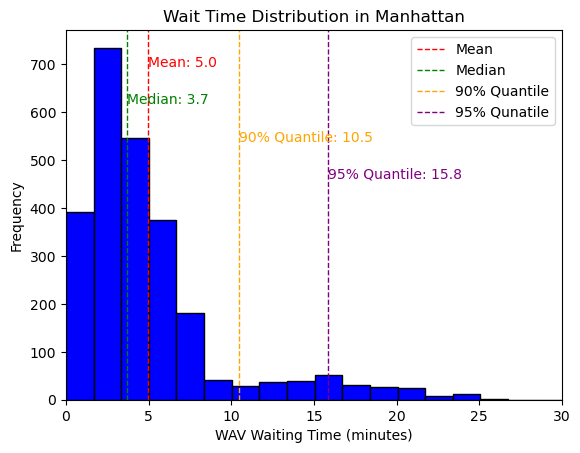

In [30]:
import matplotlib.pyplot as plt

# Assuming finite_wait_times is your filtered data without infinite values
waiting_time = df_M['waiting_time']
mean_wait_time = waiting_time.mean()
median_wait_time = waiting_time.median()
quantile_90 = waiting_time.quantile(0.9)  # Calculate the 90% quantile
quantile_95 = waiting_time.quantile(0.95)  # Calculate the 95% quantile

plt.hist(df_M['waiting_time'], bins=20, color='blue', edgecolor='black')

# Add a vertical line for the mean
plt.axvline(mean_wait_time, color='red', linestyle='dashed', linewidth=1)
# Add a vertical line for the median
plt.axvline(median_wait_time, color='green', linestyle='dashed', linewidth=1)
# Add a vertical line for the 90% quantile
plt.axvline(quantile_90, color='orange', linestyle='dashed', linewidth=1)
plt.axvline(quantile_95, color='purple', linestyle='dashed', linewidth=1)


# Annotate the mean, median, and 90% quantile
plt.text(mean_wait_time, plt.ylim()[1]*0.9, f'Mean: {mean_wait_time:.1f}', color='red')
plt.text(median_wait_time, plt.ylim()[1]*0.8, f'Median: {median_wait_time:.1f}', color='green')
plt.text(quantile_90, plt.ylim()[1]*0.7, f'90% Quantile: {quantile_90:.1f}', color='orange')
plt.text(quantile_95, plt.ylim()[1]*0.6, f'95% Quantile: {quantile_95:.1f}', color='purple')


plt.title('Wait Time Distribution in Manhattan')
plt.xlabel('WAV Waiting Time (minutes)')
plt.ylabel('Frequency')
plt.legend(['Mean', 'Median', '90% Quantile','95% Qunatile'])
plt.xlim(0, 30)

plt.show()

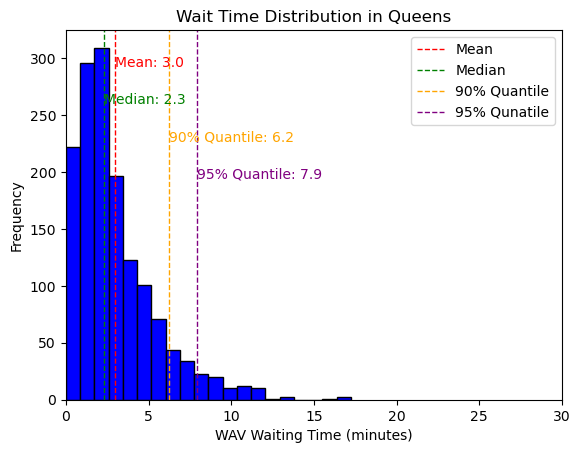

In [39]:
import matplotlib.pyplot as plt

# Assuming finite_wait_times is your filtered data without infinite values
waiting_time = df_Q['waiting_time']
mean_wait_time = waiting_time.mean()
median_wait_time = waiting_time.median()
quantile_90 = waiting_time.quantile(0.9)  # Calculate the 90% quantile
quantile_95 = waiting_time.quantile(0.95)  # Calculate the 95% quantile

plt.hist(df_Q['waiting_time'], bins=20, color='blue', edgecolor='black')

# Add a vertical line for the mean
plt.axvline(mean_wait_time, color='red', linestyle='dashed', linewidth=1)
# Add a vertical line for the median
plt.axvline(median_wait_time, color='green', linestyle='dashed', linewidth=1)
# Add a vertical line for the 90% quantile
plt.axvline(quantile_90, color='orange', linestyle='dashed', linewidth=1)
plt.axvline(quantile_95, color='purple', linestyle='dashed', linewidth=1)


# Annotate the mean, median, and 90% quantile
plt.text(mean_wait_time, plt.ylim()[1]*0.9, f'Mean: {mean_wait_time:.1f}', color='red')
plt.text(median_wait_time, plt.ylim()[1]*0.8, f'Median: {median_wait_time:.1f}', color='green')
plt.text(quantile_90, plt.ylim()[1]*0.7, f'90% Quantile: {quantile_90:.1f}', color='orange')
plt.text(quantile_95, plt.ylim()[1]*0.6, f'95% Quantile: {quantile_95:.1f}', color='purple')


plt.title('Wait Time Distribution in Queens')
plt.xlabel('WAV Waiting Time (minutes)')
plt.ylabel('Frequency')
plt.legend(['Mean', 'Median', '90% Quantile','95% Qunatile'])
plt.xlim(0, 30)

plt.show()

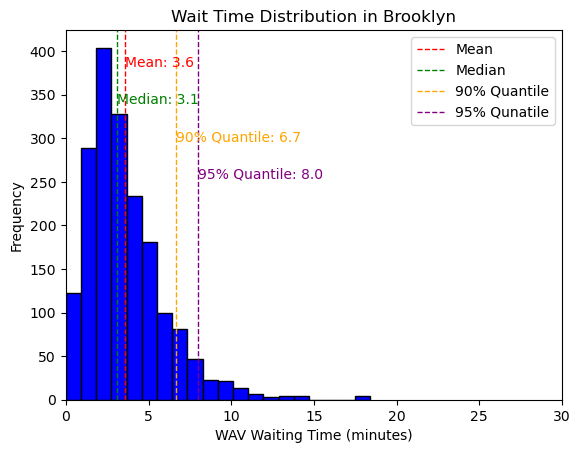

In [40]:
import matplotlib.pyplot as plt

# Assuming finite_wait_times is your filtered data without infinite values
waiting_time = df_B['waiting_time']
mean_wait_time = waiting_time.mean()
median_wait_time = waiting_time.median()
quantile_90 = waiting_time.quantile(0.9)  # Calculate the 90% quantile
quantile_95 = waiting_time.quantile(0.95)  # Calculate the 95% quantile

plt.hist(df_B['waiting_time'], bins=20, color='blue', edgecolor='black')

# Add a vertical line for the mean
plt.axvline(mean_wait_time, color='red', linestyle='dashed', linewidth=1)
# Add a vertical line for the median
plt.axvline(median_wait_time, color='green', linestyle='dashed', linewidth=1)
# Add a vertical line for the 90% quantile
plt.axvline(quantile_90, color='orange', linestyle='dashed', linewidth=1)
plt.axvline(quantile_95, color='purple', linestyle='dashed', linewidth=1)


# Annotate the mean, median, and 90% quantile
plt.text(mean_wait_time, plt.ylim()[1]*0.9, f'Mean: {mean_wait_time:.1f}', color='red')
plt.text(median_wait_time, plt.ylim()[1]*0.8, f'Median: {median_wait_time:.1f}', color='green')
plt.text(quantile_90, plt.ylim()[1]*0.7, f'90% Quantile: {quantile_90:.1f}', color='orange')
plt.text(quantile_95, plt.ylim()[1]*0.6, f'95% Quantile: {quantile_95:.1f}', color='purple')


plt.title('Wait Time Distribution in Brooklyn')
plt.xlabel('WAV Waiting Time (minutes)')
plt.ylabel('Frequency')
plt.legend(['Mean', 'Median', '90% Quantile','95% Qunatile'])
plt.xlim(0, 30)

plt.show()

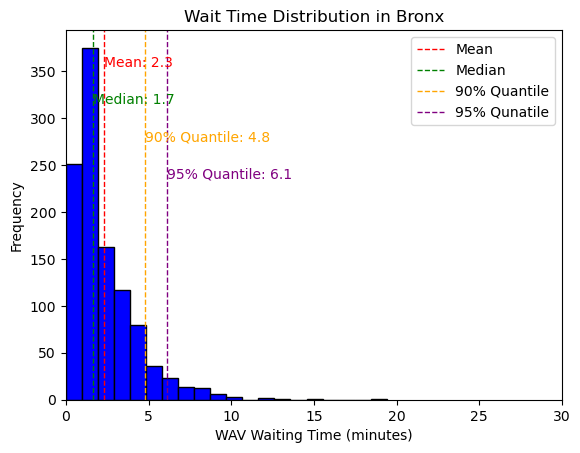

In [41]:
import matplotlib.pyplot as plt

# Assuming finite_wait_times is your filtered data without infinite values
waiting_time = df_X['waiting_time']
mean_wait_time = waiting_time.mean()
median_wait_time = waiting_time.median()
quantile_90 = waiting_time.quantile(0.9)  # Calculate the 90% quantile
quantile_95 = waiting_time.quantile(0.95)  # Calculate the 95% quantile

plt.hist(df_X['waiting_time'], bins=20, color='blue', edgecolor='black')

# Add a vertical line for the mean
plt.axvline(mean_wait_time, color='red', linestyle='dashed', linewidth=1)
# Add a vertical line for the median
plt.axvline(median_wait_time, color='green', linestyle='dashed', linewidth=1)
# Add a vertical line for the 90% quantile
plt.axvline(quantile_90, color='orange', linestyle='dashed', linewidth=1)
plt.axvline(quantile_95, color='purple', linestyle='dashed', linewidth=1)


# Annotate the mean, median, and 90% quantile
plt.text(mean_wait_time, plt.ylim()[1]*0.9, f'Mean: {mean_wait_time:.1f}', color='red')
plt.text(median_wait_time, plt.ylim()[1]*0.8, f'Median: {median_wait_time:.1f}', color='green')
plt.text(quantile_90, plt.ylim()[1]*0.7, f'90% Quantile: {quantile_90:.1f}', color='orange')
plt.text(quantile_95, plt.ylim()[1]*0.6, f'95% Quantile: {quantile_95:.1f}', color='purple')


plt.title('Wait Time Distribution in Bronx')
plt.xlabel('WAV Waiting Time (minutes)')
plt.ylabel('Frequency')
plt.legend(['Mean', 'Median', '90% Quantile','95% Qunatile'])
plt.xlim(0, 30)

plt.show()

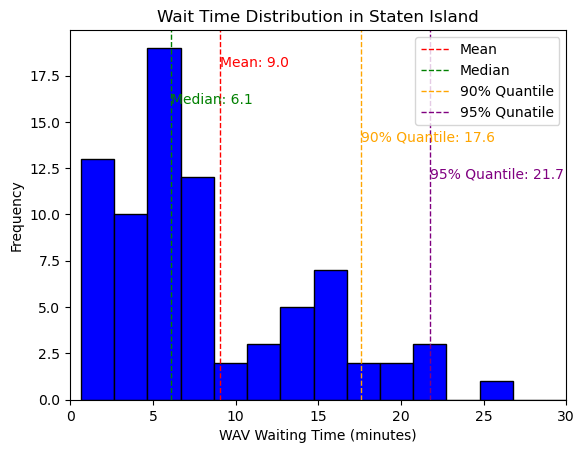

In [42]:
import matplotlib.pyplot as plt

# Assuming finite_wait_times is your filtered data without infinite values
waiting_time = df_S['waiting_time']
mean_wait_time = waiting_time.mean()
median_wait_time = waiting_time.median()
quantile_90 = waiting_time.quantile(0.9)  # Calculate the 90% quantile
quantile_95 = waiting_time.quantile(0.95)  # Calculate the 95% quantile

plt.hist(df_S['waiting_time'], bins=20, color='blue', edgecolor='black')

# Add a vertical line for the mean
plt.axvline(mean_wait_time, color='red', linestyle='dashed', linewidth=1)
# Add a vertical line for the median
plt.axvline(median_wait_time, color='green', linestyle='dashed', linewidth=1)
# Add a vertical line for the 90% quantile
plt.axvline(quantile_90, color='orange', linestyle='dashed', linewidth=1)
plt.axvline(quantile_95, color='purple', linestyle='dashed', linewidth=1)


# Annotate the mean, median, and 90% quantile
plt.text(mean_wait_time, plt.ylim()[1]*0.9, f'Mean: {mean_wait_time:.1f}', color='red')
plt.text(median_wait_time, plt.ylim()[1]*0.8, f'Median: {median_wait_time:.1f}', color='green')
plt.text(quantile_90, plt.ylim()[1]*0.7, f'90% Quantile: {quantile_90:.1f}', color='orange')
plt.text(quantile_95, plt.ylim()[1]*0.6, f'95% Quantile: {quantile_95:.1f}', color='purple')


plt.title('Wait Time Distribution in Staten Island')
plt.xlabel('WAV Waiting Time (minutes)')
plt.ylabel('Frequency')
plt.legend(['Mean', 'Median', '90% Quantile','95% Qunatile'])
plt.xlim(0, 30)

plt.show()

In [58]:
import numpy as np
import geopandas as gpd
import osmnx as ox
from shapely.geometry import Point

def create_random_node_point(G):
    """
    Create a GeoSeries for a random node from a graph G.

    Parameters:
    G (NetworkX graph): The graph from which to select a random node.
    crs (str): The coordinate reference system for the GeoSeries.

    """
    random_node_id = np.random.choice(list(G.nodes))
    random_node_data = G.nodes[random_node_id]
    random_node_point = Point(random_node_data['x'], random_node_data['y'])
    #random_node_series = gpd.GeoSeries([random_node_point], crs="EPSG:4326")
    return random_node_point

def find_nearest_base(node_point_series, gdf, source_crs="EPSG:4326", target_crs="EPSG:32618"):
    """
    Find the geometry of the nearest base to a point, returning the geometry in WGS84.

    Parameters:
    node_point_series (geopandas.GeoSeries): A GeoSeries containing the point geometry to compare.
    gdf (geopandas.GeoDataFrame): A GeoDataFrame containing base points.
    source_crs (str): The initial CRS of the geometries.
    target_crs (str): The CRS for distance calculations.

    Returns:
    shapely.geometry.base.BaseGeometry: The geometry of the nearest base in WGS84.
    """
    # Convert the node point to the target CRS for distance calculation
    node_point_utm = node_point_series.to_crs(target_crs)

    # Also convert the GeoDataFrame to the target CRS
    gdf_utm = gdf.to_crs(target_crs)

    # Calculate distances in the target CRS
    distances = gdf_utm.distance(node_point_utm.iloc[0])

    # Find the nearest base index and geometry in the target CRS
    nearest_base_idx = distances.idxmin()
    nearest_base_geom_utm = gdf_utm.loc[nearest_base_idx].geometry

    # Convert the nearest base geometry back to the source CRS (WGS84)
    nearest_base_geom_wgs84 = gpd.GeoSeries([nearest_base_geom_utm], crs=target_crs).to_crs(source_crs).iloc[0]

    return nearest_base_geom_wgs84

# Example usage:
G = ox.graph_from_place('Manhattan, New York City, New York, USA', network_type='drive')


# Create a random node GeoSeries with the same CRS as the graph
#random_node_series = create_random_node_series(G)
random_node_point = create_random_node_point(G)
# Find the nearest base point to the random node
random_node_series = gpd.GeoSeries([random_node_point], crs='EPSG:4326')
nearest_base_point = find_nearest_base(random_node_series, points_within_boroughs)

print(random_node_point)
print(nearest_base_point)


POINT (-73.9114398 40.8688503)
POINT (-73.91664 40.868849999999995)


In [42]:
import osmnx as ox
import pandas as pd
import networkx as nx

# Make sure points_within_boroughs is defined with the required data
# points_within_boroughs = ...

# Simulation settings
num_simulations = 4000  # Number of simulations
average_speed_kmph = 21.6  # Assumed constant speed, need to change the value across boroughs
average_speed_mpm = average_speed_kmph * 1000 / 60  # Average speed in m/min


'''
The average speed in Manhattan is 21.6 kph, average_speed_manhattan_kmph = 21.6
The average speed in Queens is 27.8 kph, average_speed_queens_kmph = 27.8
The average speed in Bronx is 22.3 kph,...
The average speed in Staten Island is 25.2 kph
The average speed in Brooklyn is 26.9 kph
'''
# Create a DataFrame to store the results
simulation_results = []


# Run the simulation
for _ in range(num_simulations):
    # Create a random node GeoSeries
    random_node_point =  create_random_node_point(G)
    random_node_series = gpd.GeoSeries([random_node_point], crs='EPSG:4326')

    # Find the nearest base to the random node
    nearest_base_point = find_nearest_base(random_node_series, points_within_boroughs)

    # Find the nearest node in the graph to the random node and the base
    random_node_id = ox.distance.nearest_nodes(G, random_node_series.x.iloc[0], random_node_series.y.iloc[0])
    nearest_base_id = ox.distance.nearest_nodes(G, nearest_base_point.x, nearest_base_point.y)

    # Calculate the shortest path length in the graph
    try:
        shortest_path_length = nx.shortest_path_length(G, source=nearest_base_id, target=random_node_id, weight='length')
        wait_time = shortest_path_length / average_speed_mpm
    except nx.NetworkXNoPath:
        wait_time = float('inf')  # If no path found, set wait time to infinity

    # Store the results
    simulation_results.append({
        'random_node': random_node_point,
        'nearest_base': nearest_base_point,
        'wait_time': wait_time
    })

# Convert the list of results to a DataFrame
results_df_M = pd.DataFrame(simulation_results)


#print(results_df_Q) #Queens done
#print(results_df_X) #Bronx done
#print(results_df_B) #Brooklyn done
print(results_df_M) #Manhattan done
#print(results_df_S) #Staten Island done



NameError: name 'create_random_node_point' is not defined

In [ ]:
# Create a DataFrame to store the results
simulation_results = []


# Run the simulation
for _ in range(num_simulations):

    # Find the nearest base to the random node
    nearest_base_point = find_nearest_base(random_node_series, points_within_boroughs)

    # Find the nearest node in the graph to the random node and the base
    random_node_id = ox.distance.nearest_nodes(G, random_node_series.x.iloc[0], random_node_series.y.iloc[0])
    nearest_base_id = ox.distance.nearest_nodes(G, nearest_base_point.x, nearest_base_point.y)

    # Calculate the shortest path length in the graph
    try:
        shortest_path_length = nx.shortest_path_length(G, source=nearest_base_id, target=random_node_id, weight='length')
        wait_time = shortest_path_length / average_speed_mpm
    except nx.NetworkXNoPath:
        wait_time = float('inf')  # If no path found, set wait time to infinity

    # Store the results
    simulation_results.append({
        'random_node': random_node_point,
        'nearest_base': nearest_base_point,
        'wait_time': wait_time
    })

# Convert the list of results to a DataFrame
results_df_M = pd.DataFrame(simulation_results)

In [ ]:
import matplotlib.pyplot as plt

# Assuming finite_wait_times is your filtered data without infinite values
finite_wait_times = results_df_S[results_df_S['wait_time'] < float('inf')]['wait_time']
mean_wait_time = finite_wait_times.mean()
median_wait_time = finite_wait_times.median()
quantile_90 = finite_wait_times.quantile(0.9)  # Calculate the 90% quantile
quantile_95 = finite_wait_times.quantile(0.95)  # Calculate the 95% quantile


plt.hist(finite_wait_times, bins=20, color='blue', edgecolor='black')

# Add a vertical line for the mean
plt.axvline(mean_wait_time, color='red', linestyle='dashed', linewidth=1)
# Add a vertical line for the median
plt.axvline(median_wait_time, color='green', linestyle='dashed', linewidth=1)
# Add a vertical line for the 90% quantile
plt.axvline(quantile_90, color='orange', linestyle='dashed', linewidth=1)
plt.axvline(quantile_95, color='purple', linestyle='dashed', linewidth=1)


# Annotate the mean, median, and 90% quantile
plt.text(mean_wait_time, plt.ylim()[1]*0.9, f'Mean: {mean_wait_time:.1f}', color='red')
plt.text(median_wait_time, plt.ylim()[1]*0.8, f'Median: {median_wait_time:.1f}', color='green')
plt.text(quantile_90, plt.ylim()[1]*0.7, f'90% Quantile: {quantile_90:.1f}', color='orange')
plt.text(quantile_95, plt.ylim()[1]*0.6, f'95% Quantile: {quantile_95:.1f}', color='purple')


plt.title('Wait Time Distribution in Staten Island')
plt.xlabel('WAV Waiting Time (minutes)')
plt.ylabel('Frequency')
plt.legend(['Mean', 'Median', '90% Quantile','95% Qunatile'])
plt.xlim(0, 60)

plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Assuming finite_wait_times is your filtered data without infinite values
finite_wait_times = results_df_M[results_df_M['wait_time'] < float('inf')]['wait_time']
mean_wait_time = finite_wait_times.mean()
median_wait_time = finite_wait_times.median()
quantile_90 = finite_wait_times.quantile(0.9)  # Calculate the 90% quantile
quantile_95 = finite_wait_times.quantile(0.95)  # Calculate the 95% quantile


plt.hist(finite_wait_times, bins=20, color='blue', edgecolor='black')

# Add a vertical line for the mean
plt.axvline(mean_wait_time, color='red', linestyle='dashed', linewidth=1)
# Add a vertical line for the median
plt.axvline(median_wait_time, color='green', linestyle='dashed', linewidth=1)
# Add a vertical line for the 90% quantile
plt.axvline(quantile_90, color='orange', linestyle='dashed', linewidth=1)
plt.axvline(quantile_95, color='purple', linestyle='dashed', linewidth=1)


# Annotate the mean, median, and 90% quantile
plt.text(mean_wait_time, plt.ylim()[1]*0.9, f'Mean: {mean_wait_time:.1f}', color='red')
plt.text(median_wait_time, plt.ylim()[1]*0.8, f'Median: {median_wait_time:.1f}', color='green')
plt.text(quantile_90, plt.ylim()[1]*0.7, f'90% Quantile: {quantile_90:.1f}', color='orange')
plt.text(quantile_95, plt.ylim()[1]*0.6, f'95% Quantile: {quantile_95:.1f}', color='purple')


plt.title('Wait Time Distribution in Manhattan')
plt.xlabel('WAV Waiting Time (minutes)')
plt.ylabel('Frequency')
plt.legend(['Mean', 'Median', '90% Quantile','95% Qunatile'])
plt.xlim(0, 30)

plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Assuming finite_wait_times is your filtered data without infinite values
finite_wait_times = results_df_X[results_df_X['wait_time'] < float('inf')]['wait_time']

mean_wait_time = finite_wait_times.mean()
median_wait_time = finite_wait_times.median()
quantile_90 = finite_wait_times.quantile(0.9)  # Calculate the 90% quantile
quantile_95 = finite_wait_times.quantile(0.95)  # Calculate the 95% quantile


plt.hist(finite_wait_times, bins=20, color='blue', edgecolor='black')

# Add a vertical line for the mean
plt.axvline(mean_wait_time, color='red', linestyle='dashed', linewidth=1)
# Add a vertical line for the median
plt.axvline(median_wait_time, color='green', linestyle='dashed', linewidth=1)
# Add a vertical line for the 90% quantile
plt.axvline(quantile_90, color='orange', linestyle='dashed', linewidth=1)
plt.axvline(quantile_95, color='purple', linestyle='dashed', linewidth=1)


# Annotate the mean, median, and 90% quantile
plt.text(mean_wait_time, plt.ylim()[1]*0.9, f'Mean: {mean_wait_time:.1f}', color='red')
plt.text(median_wait_time, plt.ylim()[1]*0.8, f'Median: {median_wait_time:.1f}', color='green')
plt.text(quantile_90, plt.ylim()[1]*0.7, f'90% Quantile: {quantile_90:.1f}', color='orange')
plt.text(quantile_95, plt.ylim()[1]*0.6, f'95% Quantile: {quantile_95:.1f}', color='purple')


plt.title('Wait Time Distribution in Bronx')
plt.xlabel('WAV Waiting Time (minutes)')
plt.ylabel('Frequency')
plt.legend(['Mean', 'Median', '90% Quantile','95% Qunatile'])
plt.xlim(0, 30)

plt.show()



In [ ]:
import matplotlib.pyplot as plt

# Assuming finite_wait_times is your filtered data without infinite values
finite_wait_times = results_df_B[results_df_B['wait_time'] < float('inf')]['wait_time']

mean_wait_time = finite_wait_times.mean()
median_wait_time = finite_wait_times.median()
quantile_90 = finite_wait_times.quantile(0.9)  # Calculate the 90% quantile
quantile_95 = finite_wait_times.quantile(0.95)  # Calculate the 95% quantile


plt.hist(finite_wait_times, bins=20, color='blue', edgecolor='black')

# Add a vertical line for the mean
plt.axvline(mean_wait_time, color='red', linestyle='dashed', linewidth=1)
# Add a vertical line for the median
plt.axvline(median_wait_time, color='green', linestyle='dashed', linewidth=1)
# Add a vertical line for the 90% quantile
plt.axvline(quantile_90, color='orange', linestyle='dashed', linewidth=1)
plt.axvline(quantile_95, color='purple', linestyle='dashed', linewidth=1)


# Annotate the mean, median, and 90% quantile
plt.text(mean_wait_time, plt.ylim()[1]*0.9, f'Mean: {mean_wait_time:.1f}', color='red')
plt.text(median_wait_time, plt.ylim()[1]*0.8, f'Median: {median_wait_time:.1f}', color='green')
plt.text(quantile_90, plt.ylim()[1]*0.7, f'90% Quantile: {quantile_90:.1f}', color='orange')
plt.text(quantile_95, plt.ylim()[1]*0.6, f'95% Quantile: {quantile_95:.1f}', color='purple')


plt.title('Wait Time Distribution in Brooklyn')
plt.xlabel('WAV Waiting Time (minutes)')
plt.ylabel('Frequency')
plt.legend(['Mean', 'Median', '90% Quantile','95% Qunatile'])
plt.xlim(0, 30)

plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Assuming finite_wait_times is your filtered data without infinite values
finite_wait_times = results_df_Q[results_df_Q['wait_time'] < float('inf')]['wait_time']

mean_wait_time = finite_wait_times.mean()
median_wait_time = finite_wait_times.median()
quantile_90 = finite_wait_times.quantile(0.9)  # Calculate the 90% quantile
quantile_95 = finite_wait_times.quantile(0.95)  # Calculate the 95% quantile


plt.hist(finite_wait_times, bins=30, color='blue', edgecolor='black')

# Add a vertical line for the mean
plt.axvline(mean_wait_time, color='red', linestyle='dashed', linewidth=1)
# Add a vertical line for the median
plt.axvline(median_wait_time, color='green', linestyle='dashed', linewidth=1)
# Add a vertical line for the 90% quantile
plt.axvline(quantile_90, color='orange', linestyle='dashed', linewidth=1)
plt.axvline(quantile_95, color='purple', linestyle='dashed', linewidth=1)


# Annotate the mean, median, and 90% quantile
plt.text(mean_wait_time, plt.ylim()[1]*0.9, f'Mean: {mean_wait_time:.1f}', color='red')
plt.text(median_wait_time, plt.ylim()[1]*0.8, f'Median: {median_wait_time:.1f}', color='green')
plt.text(quantile_90, plt.ylim()[1]*0.7, f'90% Quantile: {quantile_90:.1f}', color='orange')
plt.text(quantile_95, plt.ylim()[1]*0.6, f'95% Quantile: {quantile_95:.1f}', color='purple')


plt.title('Wait Time Distribution in Queens')
plt.xlabel('WAV Waiting Time (minutes)')
plt.ylabel('Frequency')
plt.legend(['Mean', 'Median', '90% Quantile','95% Qunatile'])
plt.xlim(0, 30)

plt.show()


In [ ]:
df_M= df_traffic[df_traffic['BOROUGH']=='Manhattan']
df_Q= df_traffic[df_traffic['BOROUGH']=='Queens']
df_X= df_traffic[df_traffic['BOROUGH']=='Bronx']
df_S= df_traffic[df_traffic['BOROUGH']=='Staten Island']
df_B= df_traffic[df_traffic['BOROUGH']=='Brooklyn']

In [ ]:
print("The average speed in Manhattan is", df_M['SPEED'].mean()*1.61,"kph")
print("The average speed in Queens is",df_Q['SPEED'].mean()*1.61,"kph")
print("The average speed in Bronx is",df_X['SPEED'].mean()*1.61,"kph")
print("The average speed in Staten Island is",df_S['SPEED'].mean()*1.61,"kph")
print("The average speed in Brooklyn is",df_B['SPEED'].mean()*1.61,"kph")


In [ ]:
average_speeds = {
    "Manhattan": 21.63413934552519,
    "Queens": 27.793042973327623,
    "Bronx": 22.30564254263416,
    "Staten Island": 25.19848553621779,
    "Brooklyn": 26.870304297400576
}

# Print the average speeds, rounded to one decimal place
for borough, speed in average_speeds.items():
    print(f"The average speed in {borough} is {speed:.1f} kph")

In [ ]:
import pandas as pd

print(len(results_df_M))
# Assuming results_df_M, results_df_Q, results_df_X, results_df_S, and results_df_B are predefined DataFrames
df = pd.concat([results_df_M, results_df_Q, results_df_X, results_df_S, results_df_B], ignore_index=True)

# Now df is a DataFrame containing all the rows from the individual borough DataFrames


In [ ]:
#df.to_csv('/content/drive/My Drive/rawdata/1/simulation_df.csv')

In [ ]:
df_zone = pd.read_csv('/content/drive/My Drive/rawdata/1/taxi_zones.csv', engine = 'pyarrow')
print(df_zone)


# Check if 'the_geom' contains strings and needs conversion
if isinstance(df_zone['the_geom'].iloc[0], str):
    df_zone['the_geom'] = df_zone['the_geom'].apply(wkt.loads)  # Convert WKT string to geometry
    taxi_zones_gdf = gpd.GeoDataFrame(df_zone, geometry='the_geom')  # Create GeoDataFrame
else:
    # 'the_geom' already contains geometry objects, so just ensure it's a GeoDataFrame
    taxi_zones_gdf = gpd.GeoDataFrame(df_zone, geometry='the_geom')


In [ ]:
# results_df_Q가 pandas DataFrame으로부터 올바른 GeoDataFrame을 생성하기 위한 코드
# 'random_node' 열에 있는 Point 객체로부터 x와 y 좌표를 추출합니다.
df['random_node_x'] = df['random_node'].apply(lambda p: p.x)
df['random_node_y'] = df['random_node'].apply(lambda p: p.y)

# 이제 gpd.points_from_xy 함수를 사용하여 geometry 열을 생성할 수 있습니다.
df = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['random_node_x'], df['random_node_y']))

# 이후의 spatial join 작업을 계속합니다.

# Now perform the spatial join
joined_results = gpd.sjoin(df, taxi_zones_gdf, how='left', op='within')

print(joined_results.head())



In [ ]:
joined_results['wait_time'] = joined_results['wait_time'].replace([np.inf, -np.inf], np.nan)


In [ ]:
joined_results.to_csv('/content/drive/My Drive/rawdata/1/simulation_df.csv')

In [ ]:
# 'LocationID'로 그룹화하고 'wait_time'의 평균을 계산합니다.
location_wait_times = joined_results.groupby('LocationID')['wait_time'].quantile(0.95)

# 결과를 출력합니다.
print(location_wait_times)


In [ ]:


# 택시 존 데이터 로드
taxi_zone_df = pd.read_csv('/content/drive/My Drive/taxi_zones (1).csv')

df_wait = pd.merge(location_wait_times, taxi_zone_df, left_on='LocationID', right_on='LocationID')

print(df_wait)



In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely import wkt

# 'the_geom' 열이 WKT 포맷의 문자열을 포함하고 있다고 가정합니다.
df_wait['geometry'] = df_wait['the_geom'].apply(wkt.loads)  # WKT를 shapely geometry로 변환합니다.

# GeoDataFrame을 생성합니다. 'geometry' 열을 이용합니다.
gdf = gpd.GeoDataFrame(df_wait, geometry='geometry')

# 플롯을 생성합니다. 'wait_time' 열을 기준으로 색상을 지정합니다.
fig, ax = plt.subplots(figsize=(15, 15))
gdf.plot(ax=ax, column='wait_time', cmap='inferno', legend=True, vmin=0, vmax=30)  # 'wait_time' 열에 따라 색상을 지정합니다.
#plasma
#viridis
#inferno
#RdYlGn
#Spectral

# 제목과 축 레이블을 설정합니다.
ax.set_title('Waiting Time Distribution')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# 컬러바를 추가합니다. 컬러바의 레이블을 'wait_time'으로 설정합니다.
#cbar = plt.colorbar(ax.collections[0], ax=ax, orientation='vertical')
cbar.set_label('Wait Time')

# 지도를 보여줍니다.
plt.show()


In [ ]:
import osmnx as ox

place = 'Staten Island, New York, USA'
G = ox.graph_from_place(place, network_type='drive')
'''
1. Basic routing by distance
'''
# 출발지와 목적지 설정
orig = list(G)[0]
dest = list(G)[200]


random_node_point
orig = ox.get_nearest_node(G, random_node_point)


# 거리 기반 최단경로 1개 탐색
route = ox.shortest_path(G, orig, dest, weight='length')
fig1_1, ax = ox.plot_graph_route(G, route, route_color='y', route_linewidth=6, node_size=0.5)

# 거리 기반 최단경로 여러개 탐색
routes = ox.k_shortest_paths(G, orig, dest, k=50, weight='length')
fig1_2, ax = ox.plot_graph_routes(G, list(routes), route_colors='y', route_linewidth=3, node_size=0.5)

'''
2. Imputing travel speeds and times
'''

# impute speed on all edges missing data
G = ox.add_edge_speeds(G)

# calculate travel time (seconds) for all edges
G = ox.add_edge_travel_times(G)

ox.plot_graph(G)


# see mean speed/time values by road type
edges = ox.graph_to_gdfs(G, nodes=False)
print(edges.head(5))

edges['highway'] = edges['highway'].astype(str)
mean_num = edges.groupby('highway')[['length', 'speed_kph', 'travel_time']].mean().round(1)
mean_num